In [1]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import numpy
import math

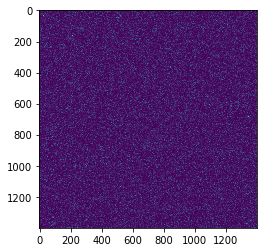

In [2]:
width = 1400
height = width
dfls = (width,height)
bmp = numpy.random.exponential(1.0,size=dfls) * numpy.random.power(5,size=dfls)
#bmp[0:height,5:10] = numpy.max(bmp)
#bmp[np.arange(height) % 17 == 0,5:50] = numpy.max(bmp)
#bmp[] = numpy.max(bmp)
imgplot = plt.imshow(bmp)

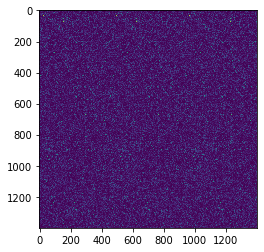

In [3]:
w = 67
for i in range(1,math.ceil(width/w)):
    s = min(width,i*w)
    e = min(width,(i+1)*w)
    r = e -s 
    bmp[0:height,s:e] = bmp[0:height,0:r]
#plt.figure(figsize = (48, 48))

imgplot = plt.imshow(bmp)

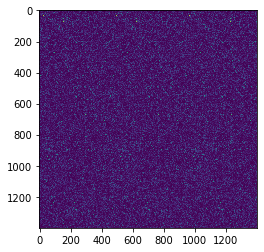

In [4]:
import cv2
ptpts = np.ndarray((height,width,2))
zeroflow = np.zeros((height,width,2)).astype('float32')
oneflow = np.ones((height,width,2)).astype('float32')
def mkpoints(ptpts):
    (w,h,n) = ptpts.shape
    for y in range(0,h):
        for x in range(0,w):
            ptpts[x,y,0] = y
            ptpts[x,y,1] = x
    return ptpts.astype('float32')
_pts = mkpoints(ptpts)

def reflow(flow):
    rflow = cv2.resize(flow, (_pts.shape[1],_pts.shape[0]))
    return rflow.astype('float32') + _pts

def apply_flow(img, flow):
    rflow = reflow(flow)
    remapped = img
    remapped = cv2.remap(remapped, rflow[...,0],rflow[...,1], 0, borderMode=cv2.BORDER_REFLECT )
    return remapped

imgplot = plt.imshow(apply_flow(bmp,zeroflow))

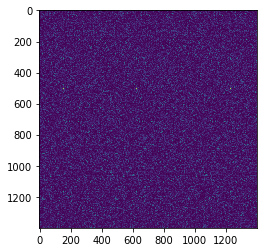

In [5]:
exampleflow = np.arange(0,width*height*2).reshape(width,height,2)*30/(width*height)
#exampleflow[...,0] *= -100
#exampleflow[...,1] *= 3
#plt.figure(figsize = (48, 48))

imgplot = plt.imshow(apply_flow(bmp,exampleflow))

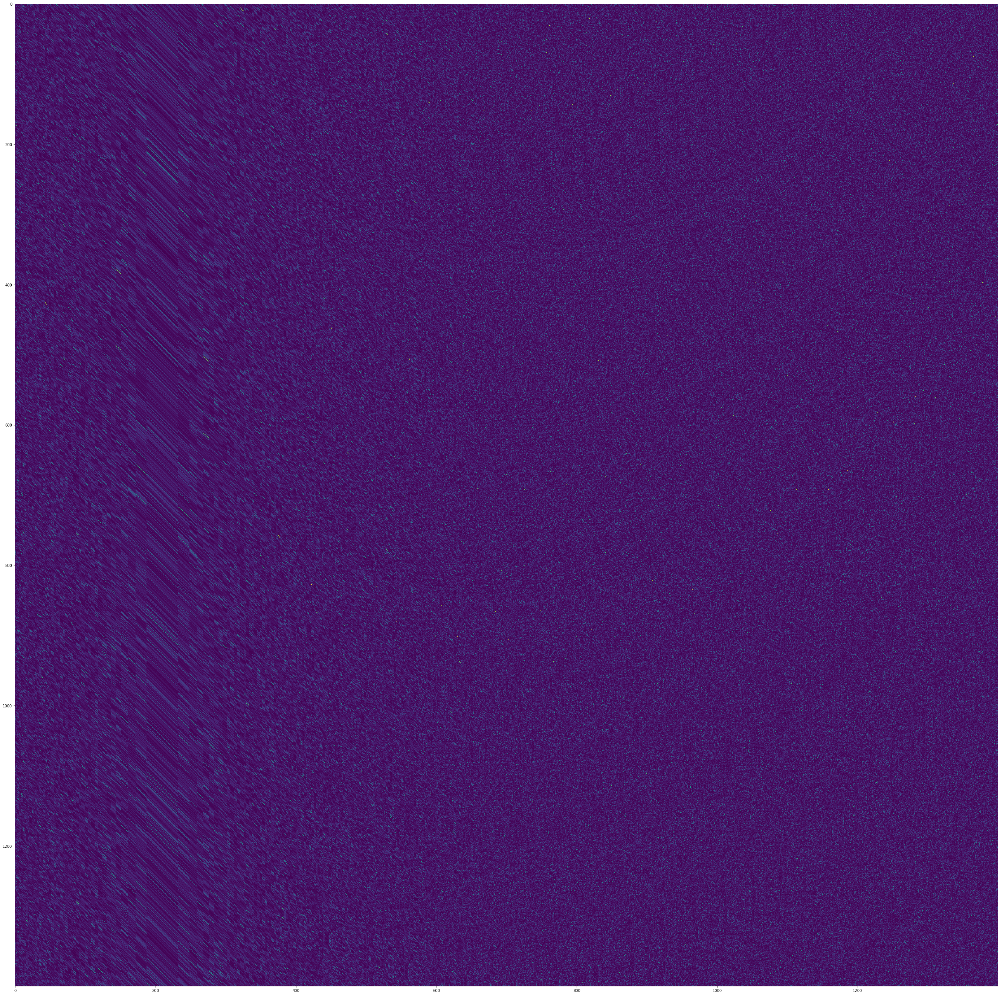

In [6]:
def fx(x,y):    
    x = 0
    y = y - height/2# - height/2
    cd = numpy.sqrt(x*x + y*y)
    return 2000*cd*cd/(width*height)
fy = fx
    
xcomp = numpy.fromfunction(fx,(width,height),dtype=numpy.float32)
ycomp = numpy.fromfunction(fy,(width,height),dtype=numpy.float32)
fflow = zeroflow + 0
fflow[...,0] = xcomp
fflow[...,1] = ycomp
ffbmp = apply_flow(bmp,fflow)
plt.figure(figsize = (48, 48))
bbmp = apply_flow(bmp,fflow)
imgplot = plt.imshow(bbmp)
# imgplot = plt.contourf(apply_flow(bmp,fflow))

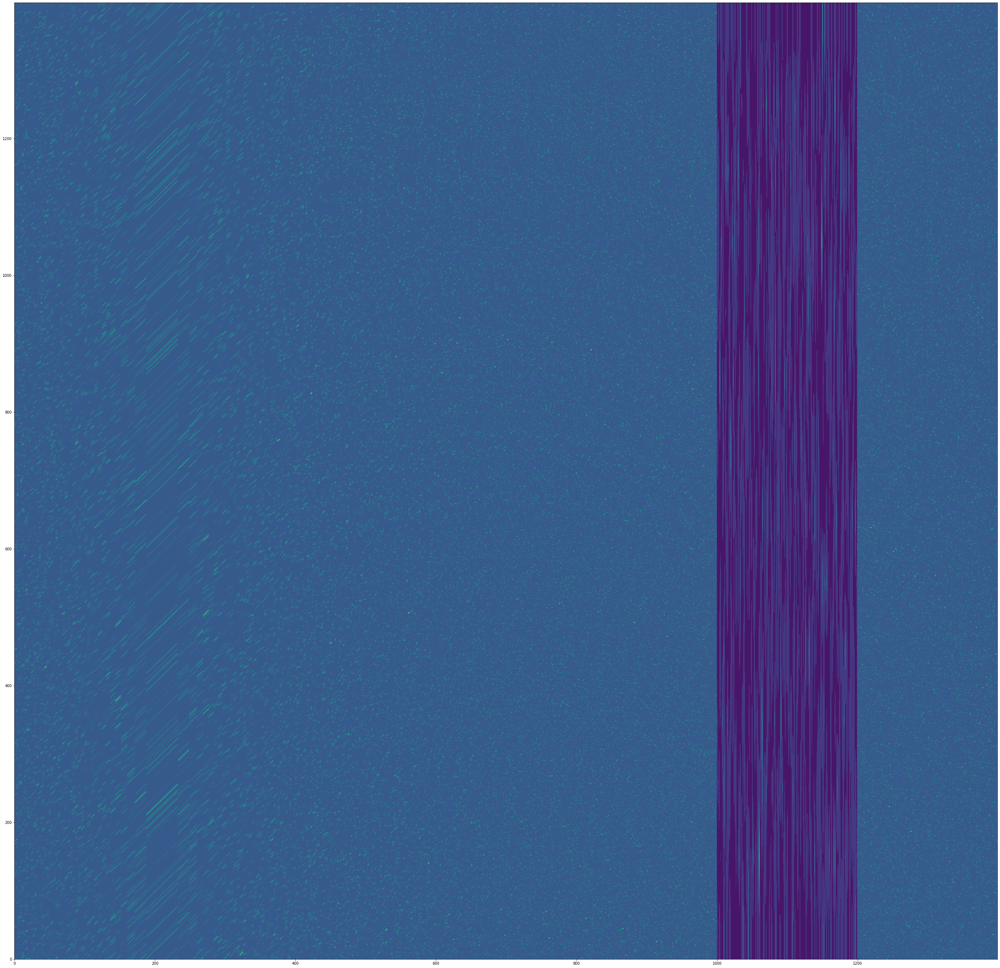

In [7]:
noise = np.random.exponential(1.0,size=(int(height/100),200))-np.max(bmp)/4.0
ffbmp[0:height,1000:1200] = cv2.resize(noise,(200,height))
plt.figure(figsize = (48, 48))
imgplot = plt.contourf(ffbmp)

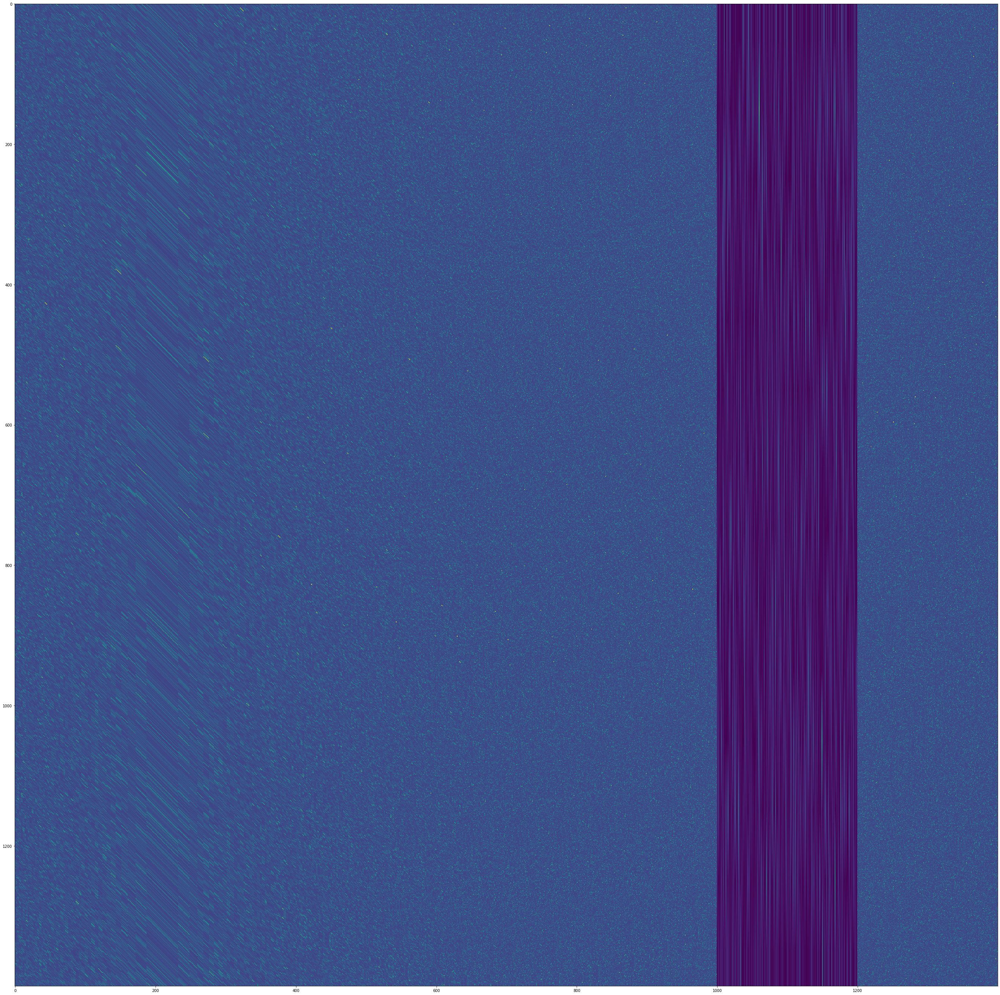

In [8]:
plt.figure(figsize = (48, 48))
imgplot = plt.imshow(ffbmp)

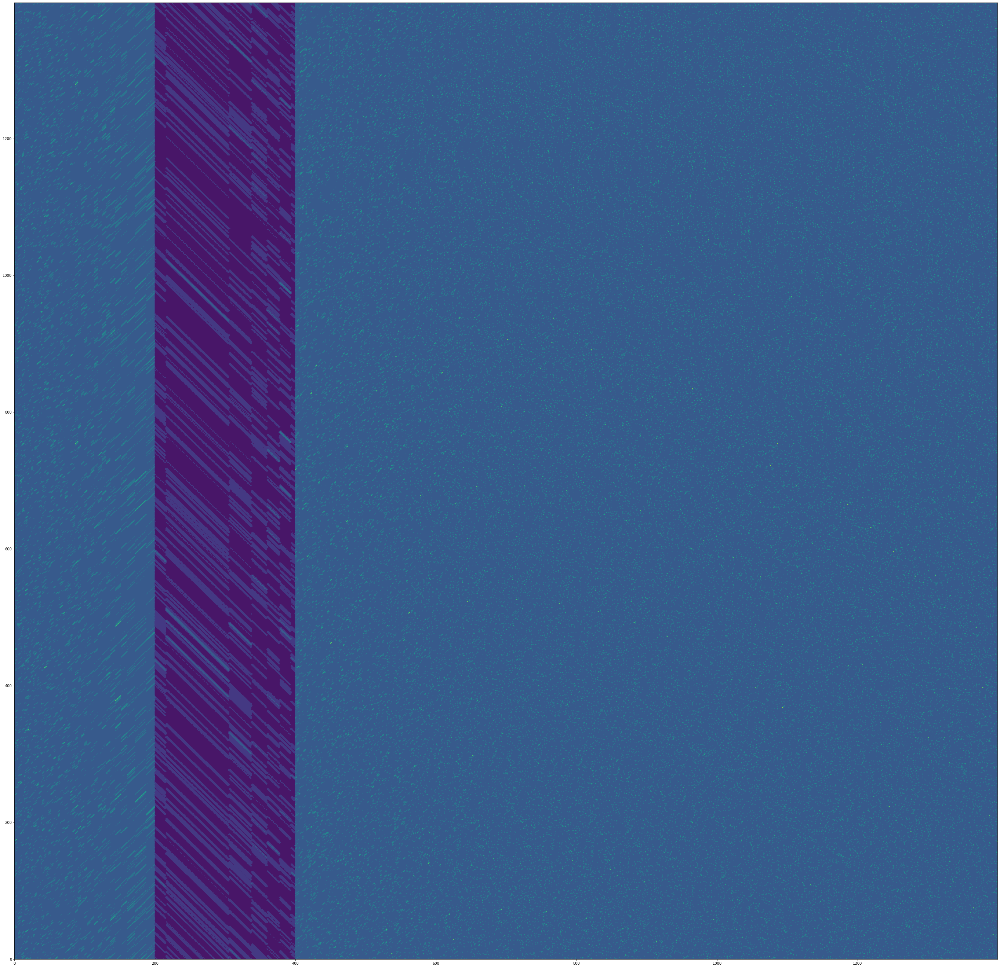

In [9]:
# noise = np.random.exponential(1.0,size=(int(height/100),200))-np.max(bmp)/4.0
ffbbmp = apply_flow(bmp,fflow)
ffbbmp[0:height,200:400] = cv2.resize(bbmp[0:int(height/2),240-np.arange(0,100)]-np.max(bmp)/4.0,(200,height))
plt.figure(figsize = (48, 48))
imgplot = plt.contourf(ffbbmp)

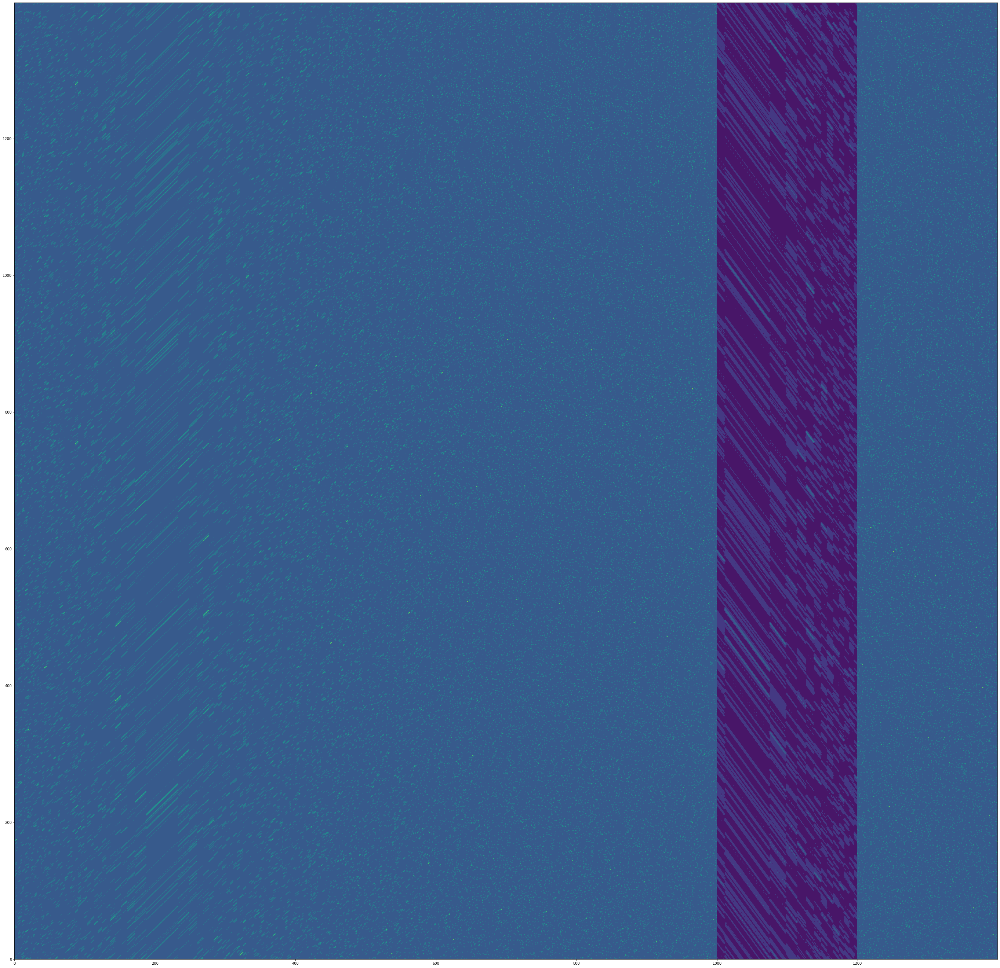

In [10]:
ffbbmp2 = apply_flow(bmp,fflow)
ffbbmp2[0:height,width-400:width-200] = cv2.resize(bbmp[0:int(height/2),240+100-np.arange(100,240)]-np.max(bmp)/4.0,(200,height))
plt.figure(figsize = (48, 48))
imgplot = plt.contourf(ffbbmp2)